In [1]:
import jax
import jax.numpy as jnp                # JAX NumPy

from flax import linen as nn           # The Linen API
from flax.training import train_state  # Useful dataclass to keep train state

import numpy as np                     # Ordinary NumPy
import optax                           # Optimizers
import tensorflow as tf                # TensorFlow for datasets
import tensorflow_datasets as tfds    # TensorFlow Datasets
tf.__version__

'2.16.1'

## Loading Datasets and Labels

In [2]:
def get_datasets():
  """Load MNIST train and test datasets into memory."""
  ds_builder = tfds.builder('mnist')
  ds_builder.download_and_prepare()
  train_ds = tfds.as_numpy(ds_builder.as_dataset(split='train', batch_size=-1))
  test_ds = tfds.as_numpy(ds_builder.as_dataset(split='test', batch_size=-1))
  train_ds['image'] = jnp.float32(train_ds['image']) / 127.5 - 1.
  test_ds['image'] = jnp.float32(test_ds['image']) / 127.5 - 1.
  return train_ds, test_ds

def get_labels(train_ds, test_ds):
    """Extract labels from train and test datasets."""
    train_labels = train_ds['label']
    test_labels = test_ds['label']
    print(type(test_labels))
    return train_labels, test_labels

train_images, test_images = get_datasets()
train_labels, test_labels = get_labels(train_images, test_images)

def print_weights(model_state):
    weights = []
    biases = []
    for layer_name, layer_params in model_state.params.items():
        print(f"Weights of layer {layer_name}:")
        # weights.append(layer_name)
        weights.append(layer_params['kernel'].astype(jnp.float64).tolist())
        # biases.append(layer_name + "_bias")
        biases.append(layer_params['bias'].astype(jnp.float64).tolist())
        print(layer_params['kernel'])
    return [weights, biases]

<class 'numpy.ndarray'>


In [3]:

import pickle as pkl
import matplotlib.pyplot as plt
#img = test_images['image'][1].reshape(28, 28).tolist()
#pkl.dump(img, open("imgs/MNIST:test-image-01", "wb" ))

In [4]:
imgs = [img.reshape(28, 28).tolist() for img in test_images['image'][0:150]]
print(test_labels)
labels = test_labels[0:150]
pkl.dump(imgs, open("imgs/MNIST_images-for-verification", "wb" ))
pkl.dump(labels.tolist(), open("imgs/MNIST_labels-for-verification", "wb" ))
print(imgs[0])

[2 0 4 ... 8 0 5]
[[-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0], [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0], [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0], [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0], [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -0.8039215803146362, -0.6627451181411743, -0.6941176652908325, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0], [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -

4


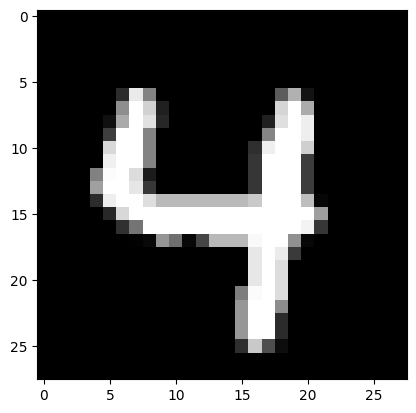

In [43]:
import matplotlib.pyplot as plt
plt.imshow(imgs[2], cmap="gray")
print(labels[2])

## Defining Activation Functions

In [5]:
# Defining the dorefa activation function using a similar mathematical framework as defined in the larq docs

def dorefa_activation(x, k_bits = 2):
    n = 2**k_bits - 1
    
    intervals = jnp.arange(0, 1, 1/(2*n))

    for i in range(len(intervals) - 1):
        x = jnp.where((x >= intervals[i]) & (x < intervals[i+1]), i/n, x)
    
    return x

def get_dorefa(bitW, bitA, bitG):
    """
    Return the three quantization functions fw, fa, fg, for weights, activations and gradients respectively
    """
    def quantize(x, k):
        n = float(2 ** k - 1)

        @jax.custom_gradient
        def _quantize(x):
            return jnp.round(x * n) / n, lambda dy: dy

        return _quantize(x)

    def fw(x):
        if bitW == 32:
            return x

        if bitW == 1:   # BWN
            E = jax.lax.stop_gradient(jnp.mean(jnp.abs(x)))

            @jax.custom_gradient
            def _sign(x):
                return jnp.where(jnp.equal(x, 0), jnp.ones_like(x), jnp.sign(x / E)) * E, lambda dy: dy

            return _sign(x)

        x = jnp.tanh(x)
        x = x / jnp.max(jnp.abs(x)) * 0.5 + 0.5
        return 2 * quantize(x, bitW) - 1

    def fa(x):
        if bitA == 32:
            return x
        return quantize(x, bitA)

    def fg(x):
        if bitG == 32:
            return x

        @jax.custom_gradient
        def _identity(input):
            def grad_fg(x):
                rank = x.get_shape().ndims
                assert rank is not None
                maxx = jnp.max(jnp.abs(x), list(range(1, rank)), keep_dims=True)
                x = x / maxx
                n = float(2**bitG - 1)
                x = x * 0.5 + 0.5 + jax.random.uniform(
                    jnp.shape(x), minval=-0.5 / n, maxval=0.5 / n)
                x = jnp.clip(x, 0.0, 1.0)
                x = quantize(x, bitG) - 0.5
                return x * maxx * 2

            return input, grad_fg

        return _identity(x)
    return fw, fa, fg

def binary_step(x):
    return jnp.where(x >= 0, 1, 0)


In [6]:
def l1_loss_func(params):
    l1_loss = 0
    for p in jax.tree.leaves(params):
      l1_loss += jnp.sum(jnp.abs(p))
      l1_loss = l1_loss * 0.001
    return l1_loss

def cross_entropy_loss(*, params, logits, labels):
  labels_onehot = jax.nn.one_hot(labels, num_classes=10)
  output_loss = optax.softmax_cross_entropy(logits=logits, labels=labels_onehot).mean()

  l1_loss = 0
  l1_loss = l1_loss_func(params)
  return output_loss + l1_loss 

def compute_metrics(*, params, logits, labels):
  loss = cross_entropy_loss(params=params, logits=logits, labels=labels)
  accuracy = jnp.mean(jnp.argmax(logits, -1) == labels)
  metrics = {
      'loss': loss,
      'accuracy': accuracy,
  }
  return metrics


In [7]:
def train_epoch(state, train_ds, batch_size, epoch, rng):
  """Train for a single epoch."""
  train_ds_size = len(train_ds['image'])
  steps_per_epoch = train_ds_size // batch_size

  perms = jax.random.permutation(rng, train_ds_size)
  perms = perms[:steps_per_epoch * batch_size]  # skip incomplete batch
  perms = perms.reshape((steps_per_epoch, batch_size))
  batch_metrics = []
  for perm in perms:
    batch = {k: v[perm, ...] for k, v in train_ds.items()}
    state, metrics = train_step(state, batch)
    batch_metrics.append(metrics)

  # compute mean of metrics across each batch in epoch.
  batch_metrics_np = jax.device_get(batch_metrics)
  epoch_metrics_np = {
      k: np.mean([metrics[k] for metrics in batch_metrics_np])
      for k in batch_metrics_np[0]}

  print('train epoch: %d, loss: %.4f, accuracy: %.2f' % (
      epoch, epoch_metrics_np['loss'], epoch_metrics_np['accuracy'] * 100))

  return state

In [10]:
def eval_model(params, test_ds):
  metrics = eval_step(params, test_ds)
  metrics = jax.device_get(metrics)
  summary = jax.tree_map(lambda x: x.item(), metrics)
  return summary['loss'], summary['accuracy']

# Binary Activation - 2 Hidden Layers

In [48]:
class Dense_2_Hidden(nn.Module):
  """A simple 2 layer dense model."""
  is_deployed: bool # allows to switch from sigmoid to binary step for deployment

  def deploy_status(self, deploy_status):
    self.is_deployed = deploy_status
  
  @nn.compact
  def __call__(self, x):
    x = x.reshape((x.shape[0], -1))  # flatten the images
    x = nn.Dense(features=256)(x)
    x = nn.sigmoid(x) if not self.is_deployed else binary_step(x) # Smooth function for training, Binary Step for deployment
    x = nn.Dense(features=256)(x)
    x = nn.sigmoid(x) if not self.is_deployed else binary_step(x) # Smooth function for training, Binary Step for deployment
    x = nn.Dense(features=10)(x)
    x = nn.softmax(x)
    return x

Eval & Train Step 2 Hidden Layer

In [2]:
def create_train_state(rng, learning_rate):
  """Creates initial `TrainState`."""
  model = Dense_2_Hidden(False) ## Changes based on which model we're trying to train (needs to be changed for model)
  params = model.init(rng, jnp.ones([1, 28, 28, 1]))['params']
  tx = optax.adam(learning_rate)
  return train_state.TrainState.create(
      apply_fn=model.apply, params=params, tx=tx)

@jax.jit
def train_step(state, batch):
  """Train for a single step."""
  def loss_fn(params):
    logits = Dense_2_Hidden(False).apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
    loss = cross_entropy_loss(params=params, logits=logits, labels=batch['label'])
    return loss, logits
  grad_fn = jax.value_and_grad(loss_fn, has_aux=True)
  (_, logits), grads = grad_fn(state.params)
  state = state.apply_gradients(grads=grads)
  metrics = compute_metrics(params=state.params, logits=logits, labels=batch['label'])
  return state, metrics

@jax.jit
def eval_step(params, batch):
  logits = Dense_2_Hidden(True).apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
  return compute_metrics(params=params, logits=logits, labels=batch['label'])

rng = jax.random.PRNGKey(0)
rng, init_rng = jax.random.split(rng)
learning_rate = 1e-3
momentum = 0.9
state = create_train_state(init_rng, learning_rate)
del init_rng  # Must not be used anymore.

NameError: name 'jax' is not defined

In [50]:
print(state)

TrainState(step=0, apply_fn=<bound method Module.apply of Dense_2_Hidden(
    # attributes
    is_deployed = False
)>, params={'Dense_0': {'kernel': Array([[ 0.01902316,  0.00998085,  0.0510776 , ..., -0.03486988,
        -0.00220674,  0.06837985],
       [-0.03483726,  0.04313357,  0.00236818, ..., -0.02111995,
         0.05879913,  0.016203  ],
       [ 0.00447755,  0.03352144, -0.01148568, ...,  0.08007551,
         0.00797571,  0.02102956],
       ...,
       [ 0.00442723,  0.01658102,  0.04113685, ...,  0.03358691,
         0.01802473,  0.02458535],
       [-0.01395124,  0.03456584, -0.00800512, ...,  0.0114007 ,
        -0.05030964, -0.02679757],
       [ 0.0468614 ,  0.06096169, -0.00474466, ...,  0.02635906,
        -0.03182237, -0.04279813]], dtype=float32), 'bias': Array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0

In [51]:

num_epochs = 25
batch_size = 100
for epoch in range(1, num_epochs + 1):
  # Use a separate PRNG key to permute image data during shuffling
  rng, input_rng = jax.random.split(rng)

  # Run an optimization step over a training batch
  state = train_epoch(state, train_images, batch_size, epoch, input_rng)
  
  # Evaluate on the test set after each training epoch 
  test_loss, test_accuracy = eval_model(state.params, test_images)
  print(' test epoch: %d, loss: %.2f, accuracy: %.2f' % (
      epoch, test_loss, test_accuracy * 100))
  


train epoch: 1, loss: 1.9114, accuracy: 65.63
 test epoch: 1, loss: 1.73, accuracy: 83.23
train epoch: 2, loss: 1.6790, accuracy: 90.11
 test epoch: 2, loss: 1.64, accuracy: 91.41
train epoch: 3, loss: 1.6276, accuracy: 93.74
 test epoch: 3, loss: 1.61, accuracy: 94.36
train epoch: 4, loss: 1.6084, accuracy: 94.88
 test epoch: 4, loss: 1.60, accuracy: 94.46
train epoch: 5, loss: 1.5971, accuracy: 95.67
 test epoch: 5, loss: 1.59, accuracy: 95.42
train epoch: 6, loss: 1.5888, accuracy: 96.30
 test epoch: 6, loss: 1.59, accuracy: 95.68
train epoch: 7, loss: 1.5832, accuracy: 96.69
 test epoch: 7, loss: 1.59, accuracy: 95.25
train epoch: 8, loss: 1.5774, accuracy: 97.16
 test epoch: 8, loss: 1.59, accuracy: 95.77
train epoch: 9, loss: 1.5730, accuracy: 97.52
 test epoch: 9, loss: 1.58, accuracy: 95.82
train epoch: 10, loss: 1.5697, accuracy: 97.72
 test epoch: 10, loss: 1.58, accuracy: 96.01
train epoch: 11, loss: 1.5665, accuracy: 97.93
 test epoch: 11, loss: 1.58, accuracy: 96.01
train 

In [52]:
def check_sparsity(params, threshold=0.5):
    total_weights = 0
    zero_weights = 0

    for p in jax.tree.leaves(params):
        print("node weight:",p.size, "/n")
        total_weights += p.size
        zero_weights += jnp.sum(abs(p) < 1e-6)

    sparsity = zero_weights / total_weights

    print(f"Sparsity: {sparsity * 100:.2f}%")

    if sparsity > threshold:
        print("The weights are sparse.")
    else:
        print("The weights are not sparse.")

check_sparsity(state.params)

def print_layer_params(params, layer_name):
    layer_params = params[layer_name]
    jax.tree_map(print, layer_params)
print_layer_params(state.params, 'Dense_1') 

node weight: 256 /n
node weight: 200704 /n
node weight: 256 /n
node weight: 65536 /n
node weight: 10 /n
node weight: 2560 /n
Sparsity: 0.01%
The weights are not sparse.
[ 4.40950058e-02  3.57554704e-02  5.25468402e-02 -5.52575625e-02
  4.06100824e-02 -5.17676771e-02  4.83683757e-02 -6.51241839e-03
  4.49941792e-02  2.41584871e-02  6.31743483e-03  2.14329902e-02
 -8.19613636e-02  1.03146508e-01 -6.19227774e-02  4.16977257e-02
  4.97460924e-02 -2.37023905e-02 -1.79702360e-02  4.22072187e-02
 -2.20644362e-02 -1.31776571e-01 -6.20838441e-02  2.86662411e-02
  3.16561721e-02 -4.45483811e-02 -1.59939229e-02  2.03252112e-05
 -2.96938810e-02  6.25557750e-02 -3.99790145e-02 -7.11772079e-03
  1.58222187e-02 -1.16008982e-01 -6.88342080e-02 -4.30722199e-02
  7.22407456e-03 -6.94475919e-02  4.29305509e-02 -3.62453870e-02
 -3.88769358e-02  4.38630097e-02  4.44793738e-02 -2.54619196e-02
  2.10168026e-02 -1.73018295e-02  1.94860063e-02  5.73835336e-02
 -4.65021022e-02  4.08587046e-02 -3.40113305e-02 -2

In [53]:
import pickle as pkl

params_list = print_weights(state)
print(params_list[0], "\n")
pkl.dump(params_list, open( "models/MNIST-BAN_Dense256-Dense256.pkl", "wb"))

Weights of layer Dense_0:
[[ 0.02768258  0.04869698  0.07378207 ... -0.02909279  0.05000391
   0.10782464]
 [-0.0261778   0.08184938  0.025073   ... -0.01534287  0.11100992
   0.05564765]
 [ 0.01313707  0.07223727  0.0112191  ...  0.08585265  0.06018642
   0.06047431]
 ...
 [ 0.01308677  0.05529723  0.06384139 ...  0.03936399  0.07023563
   0.06402992]
 [-0.00529175  0.07328168  0.01469965 ...  0.01717786  0.00190125
   0.01264709]
 [ 0.05552089  0.09967738  0.01796016 ...  0.0321361   0.02038858
  -0.0033536 ]]
Weights of layer Dense_1:
[[-0.00549187  0.4147898  -0.9635299  ...  0.2676301   0.00351998
  -0.36408764]
 [ 0.16081336 -0.12647223  0.16520733 ... -0.3882433  -0.15021066
   0.23123965]
 [-0.7195723  -0.51698226  0.1695989  ... -0.118397    0.33130988
   0.03886175]
 ...
 [-0.29694083 -0.37277913  0.2250079  ... -0.3289913   0.19926131
  -0.252569  ]
 [ 0.3843549  -0.38399047  0.02974293 ... -0.15433183 -0.14690924
  -0.01717583]
 [-0.98633724 -0.2125869   0.2827471  ... -0.1

/Users/chasegeyer/.pyenv/versions/3.9.2/lib/python3.9/site-packages/jax/_src/numpy/array_methods.py:66: UserWarning: Explicitly requested dtype <class 'jax.numpy.float64'> requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  return lax_numpy.astype(arr, dtype)


# Binary Activation - 3 Hidden Layers

In [54]:
class Dense_3_Hidden(nn.Module):
  """A simple 3 layer dense model."""
  is_deployed: bool # allows to switch from sigmoid to binary step for deployment

  def deploy_status(self, deploy_status):
    self.is_deployed = deploy_status
  
  @nn.compact
  def __call__(self, x):
    x = x.reshape((x.shape[0], -1))  # flatten the images
    x = nn.Dense(features=256)(x)
    x = nn.sigmoid(x) if not self.is_deployed else binary_step(x) # Smooth function for training, Binary Step for deployment
    x = nn.Dense(features=256)(x)
    x = nn.sigmoid(x) if not self.is_deployed else binary_step(x) # Smooth function for training, Binary Step for deployment
    x = nn.Dense(features=256)(x)
    x = nn.sigmoid(x) if not self.is_deployed else binary_step(x) # Smooth function for training, Binary Step for deployment
    x = nn.Dense(features=10)(x)
    x = nn.softmax(x)
    return x


Eval & Train Step 3 Hidden Layer

In [55]:


def create_train_state(rng, learning_rate):
  """Creates initial `TrainState`."""
  model = Dense_3_Hidden(False) ## Changes based on which model we're trying to train (needs to be changed for model)
  params = model.init(rng, jnp.ones([1, 28, 28, 1]))['params']
  tx = optax.adam(learning_rate)
  return train_state.TrainState.create(
      apply_fn=model.apply, params=params, tx=tx)

@jax.jit
def train_step(state, batch):
  """Train for a single step."""
  def loss_fn(params):
    logits = Dense_3_Hidden(False).apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
    loss = cross_entropy_loss(params=params, logits=logits, labels=batch['label'])
    return loss, logits
  grad_fn = jax.value_and_grad(loss_fn, has_aux=True)
  (_, logits), grads = grad_fn(state.params)
  state = state.apply_gradients(grads=grads)
  metrics = compute_metrics(params=state.params, logits=logits, labels=batch['label'])
  return state, metrics

@jax.jit
def eval_step(params, batch):
  logits = Dense_3_Hidden(True).apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
  return compute_metrics(params=params, logits=logits, labels=batch['label'])


In [56]:
rng = jax.random.PRNGKey(0)
rng, init_rng = jax.random.split(rng)
learning_rate = 1e-3
momentum = 0.9
state = create_train_state(init_rng, learning_rate)
del init_rng  # Must not be used anymore.

num_epochs = 25
batch_size = 100
for epoch in range(1, num_epochs + 1):
  # Use a separate PRNG key to permute image data during shuffling
  rng, input_rng = jax.random.split(rng)

  # Run an optimization step over a training batch
  state = train_epoch(state, train_images, batch_size, epoch, input_rng)
  
  # Evaluate on the test set after each training epoch 
  test_loss, test_accuracy = eval_model(state.params, test_images)
  print(' test epoch: %d, loss: %.2f, accuracy: %.2f' % (
      epoch, test_loss, test_accuracy * 100))
  
import pickle as pkl
params = state.params
params_list = print_weights(state)
pkl.dump(params_list, open( "models/MNIST-BAN_Dense100-Dense100-Dense100.pkl", "wb" ))

train epoch: 1, loss: 1.9265, accuracy: 63.99
 test epoch: 1, loss: 1.72, accuracy: 85.08
train epoch: 2, loss: 1.6735, accuracy: 90.52
 test epoch: 2, loss: 1.64, accuracy: 92.04
train epoch: 3, loss: 1.6234, accuracy: 93.68
 test epoch: 3, loss: 1.60, accuracy: 94.39
train epoch: 4, loss: 1.6026, accuracy: 94.98
 test epoch: 4, loss: 1.60, accuracy: 94.91
train epoch: 5, loss: 1.5907, accuracy: 95.76
 test epoch: 5, loss: 1.59, accuracy: 94.57
train epoch: 6, loss: 1.5826, accuracy: 96.24
 test epoch: 6, loss: 1.59, accuracy: 95.16
train epoch: 7, loss: 1.5770, accuracy: 96.71
 test epoch: 7, loss: 1.60, accuracy: 93.63
train epoch: 8, loss: 1.5732, accuracy: 96.99
 test epoch: 8, loss: 1.59, accuracy: 94.94
train epoch: 9, loss: 1.5700, accuracy: 97.24
 test epoch: 9, loss: 1.59, accuracy: 94.74
train epoch: 10, loss: 1.5674, accuracy: 97.47
 test epoch: 10, loss: 1.58, accuracy: 95.69
train epoch: 11, loss: 1.5652, accuracy: 97.63
 test epoch: 11, loss: 1.58, accuracy: 95.36
train 

/Users/chasegeyer/.pyenv/versions/3.9.2/lib/python3.9/site-packages/jax/_src/numpy/array_methods.py:66: UserWarning: Explicitly requested dtype <class 'jax.numpy.float64'> requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  return lax_numpy.astype(arr, dtype)


# Dorefa k_bit = 2

In [11]:
weights_func, activation_func, gradient_func = get_dorefa(2, 2, 2)

class Dorefa_2_Hidden(nn.Module):
  """A simple 3 layer dense model."""
  is_deployed: bool # allows to switch from sigmoid to binary step for deployment

  def deploy_status(self, deploy_status):
    self.is_deployed = deploy_status
  
  @nn.compact
  def __call__(self, x):
    x = x.reshape((x.shape[0], -1))  # flatten the images
    x = nn.Dense(features=256)(x)
    x = weights_func(x) # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=256)(x)
    x = weights_func(x) # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=10)(x)
    x = nn.softmax(x)
    return x


In [58]:

def create_train_state(rng, learning_rate):
  """Creates initial `TrainState`."""
  model = Dorefa_2_Hidden(False) ## Changes based on which model we're trying to train (needs to be changed for model)
  params = model.init(rng, jnp.ones([1, 28, 28, 1]))['params']
  tx = optax.adam(learning_rate)
  return train_state.TrainState.create(
      apply_fn=model.apply, params=params, tx=tx)

@jax.jit
def train_step(state, batch):
  """Train for a single step."""
  def loss_fn(params):
    logits = Dorefa_2_Hidden(False).apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
    loss = cross_entropy_loss(params=params, logits=logits, labels=batch['label'])
    return loss, logits
  grad_fn = jax.value_and_grad(loss_fn, has_aux=True)
  (_, logits), grads = grad_fn(state.params)
  grads = gradient_func(grads)
  state = state.apply_gradients(grads=grads)
  metrics = compute_metrics(params=state.params, logits=logits, labels=batch['label'])
  return state, metrics

@jax.jit
def eval_step(params, batch):
  logits = Dorefa_2_Hidden(True).apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
  return compute_metrics(params=params, logits=logits, labels=batch['label'])


In [59]:
rng = jax.random.PRNGKey(0)
rng, init_rng = jax.random.split(rng)
learning_rate = 1e-3
state = create_train_state(init_rng, learning_rate)
del init_rng  # Must not be used anymore.

num_epochs = 25
batch_size = 130
for epoch in range(1, num_epochs + 1):
  # Use a separate PRNG key to permute image data during shuffling
  rng, input_rng = jax.random.split(rng)

  # Run an optimization step over a training batch
  state = train_epoch(state, train_images, batch_size, epoch, input_rng)
  
  # Evaluate on the test set after each training epoch 
  test_loss, test_accuracy = eval_model(state.params, test_images)
  print(' test epoch: %d, loss: %.2f, accuracy: %.2f' % (
      epoch, test_loss, test_accuracy * 100))


train epoch: 1, loss: 1.6956, accuracy: 87.53
 test epoch: 1, loss: 1.61, accuracy: 93.75
train epoch: 2, loss: 1.5889, accuracy: 94.39
 test epoch: 2, loss: 1.57, accuracy: 95.02
train epoch: 3, loss: 1.5645, accuracy: 95.69
 test epoch: 3, loss: 1.56, accuracy: 96.18
train epoch: 4, loss: 1.5527, accuracy: 96.40
 test epoch: 4, loss: 1.55, accuracy: 96.50
train epoch: 5, loss: 1.5460, accuracy: 96.90
 test epoch: 5, loss: 1.55, accuracy: 96.56
train epoch: 6, loss: 1.5424, accuracy: 97.02
 test epoch: 6, loss: 1.54, accuracy: 96.71
train epoch: 7, loss: 1.5392, accuracy: 97.31
 test epoch: 7, loss: 1.54, accuracy: 96.89
train epoch: 8, loss: 1.5371, accuracy: 97.46
 test epoch: 8, loss: 1.54, accuracy: 96.70
train epoch: 9, loss: 1.5354, accuracy: 97.59
 test epoch: 9, loss: 1.54, accuracy: 96.77
train epoch: 10, loss: 1.5338, accuracy: 97.71
 test epoch: 10, loss: 1.54, accuracy: 96.92
train epoch: 11, loss: 1.5309, accuracy: 97.91
 test epoch: 11, loss: 1.54, accuracy: 97.21
train 

In [60]:
import pickle as pkl
params = state.params
params_list = print_weights(state)
pkl.dump(params_list, open( "models/MNIST-DoReFa2_Dense256-Dense256.pkl", "wb" ))

Weights of layer Dense_0:
[[ 0.01731316  0.03084485  0.04808612 ... -0.00749862 -0.02921337
   0.10460053]
 [-0.03654711  0.06399772 -0.00062331 ...  0.00625131  0.03179242
   0.0524236 ]
 [ 0.00276757  0.05438545 -0.01447716 ...  0.10744698 -0.0190309
   0.05725024]
 ...
 [ 0.00271726  0.03744505  0.03814536 ...  0.06095811 -0.00898193
   0.06080609]
 [-0.01566122  0.05542985 -0.01099659 ...  0.03877199 -0.07731619
   0.00942309]
 [ 0.04515173  0.08182556 -0.00773614 ...  0.05373026 -0.05882911
  -0.00657717]]
Weights of layer Dense_1:
[[-0.084644    0.240722   -0.19678764 ...  0.1803136  -0.11299594
   0.06469559]
 [ 0.05714362  0.27489424 -0.17252576 ...  0.22530729 -0.24743867
  -0.07187097]
 [-0.1455054   0.08150551  0.10671486 ... -0.01910849  0.02144511
   0.08284568]
 ...
 [-0.11045409 -0.3986296  -0.0337204  ... -0.2592995   0.00357735
  -0.07240383]
 [ 0.12515795  0.03262416 -0.1355905  ...  0.07633109 -0.15176363
  -0.0149325 ]
 [-0.12064544 -0.12654209  0.03928384 ... -0.05

/Users/chasegeyer/.pyenv/versions/3.9.2/lib/python3.9/site-packages/jax/_src/numpy/array_methods.py:66: UserWarning: Explicitly requested dtype <class 'jax.numpy.float64'> requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  return lax_numpy.astype(arr, dtype)


In [61]:
params_list[0]

[[[0.0173131562769413,
   0.03084484674036503,
   0.04808611795306206,
   0.023846078664064407,
   0.020880335941910744,
   0.012464435771107674,
   -0.016847578808665276,
   0.07495997846126556,
   0.027931299060583115,
   -0.0315801203250885,
   -0.010252026841044426,
   0.011115138418972492,
   0.01294181402772665,
   0.0019611199386417866,
   0.04901447147130966,
   0.018063867464661598,
   -0.000803129281848669,
   0.043073758482933044,
   0.04182235896587372,
   -0.017266105860471725,
   -0.016232838854193687,
   -0.012528086081147194,
   -0.01338161900639534,
   0.05221742019057274,
   -0.02805016003549099,
   -0.03984997421503067,
   0.033528462052345276,
   0.02938651293516159,
   0.010562749579548836,
   0.06003241240978241,
   -0.061354268342256546,
   0.024038774892687798,
   -0.013272449374198914,
   0.02135475166141987,
   0.028428150340914726,
   -0.05217592790722847,
   -0.06554508209228516,
   -0.03676896542310715,
   0.0068198456428945065,
   -0.07877656817436218,
   

# Dorefa k_bit = 3

In [62]:
weights_func, activation_func, gradient_func = get_dorefa(3, 3, 3)



class Dorefa_3_Hidden(nn.Module):
  """A simple 3 layer dense model."""
  
  @nn.compact
  def __call__(self, x):
    x = x.reshape((x.shape[0], -1))  # flatten the images
    x = nn.Dense(features=256)(x)
    x = weights_func(x) # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=256)(x)
    x = weights_func(x) # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=10)(x)
    x = nn.softmax(x)
    return x


In [63]:

def create_train_state(rng, learning_rate):
  """Creates initial `TrainState`."""
  model = Dorefa_3_Hidden() ## Changes based on which model we're trying to train (needs to be changed for model)
  params = model.init(rng, jnp.ones([1, 28, 28, 1]))['params']
  tx = optax.adam(learning_rate)
  return train_state.TrainState.create(
      apply_fn=model.apply, params=params, tx=tx)

@jax.jit
def train_step(state, batch):
  """Train for a single step."""
  def loss_fn(params):
    logits = Dorefa_3_Hidden().apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
    loss = cross_entropy_loss(params=params, logits=logits, labels=batch['label'])
    return loss, logits
  grad_fn = jax.value_and_grad(loss_fn, has_aux=True)
  (_, logits), grads = grad_fn(state.params)
  grads = gradient_func(grads)
  state = state.apply_gradients(grads=grads)
  metrics = compute_metrics(params=state.params, logits=logits, labels=batch['label'])
  return state, metrics

@jax.jit
def eval_step(params, batch):
  logits = Dorefa_3_Hidden().apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
  return compute_metrics(params=params, logits=logits, labels=batch['label'])


In [64]:
rng = jax.random.PRNGKey(0)
rng, init_rng = jax.random.split(rng)
learning_rate = 1e-3
state = create_train_state(init_rng, learning_rate)
del init_rng  # Must not be used anymore.

num_epochs = 30
batch_size = 130
for epoch in range(1, num_epochs + 1):
  # Use a separate PRNG key to permute image data during shuffling
  rng, input_rng = jax.random.split(rng)

  # Run an optimization step over a training batch
  state = train_epoch(state, train_images, batch_size, epoch, input_rng)
  
  # Evaluate on the test set after each training epoch 
  test_loss, test_accuracy = eval_model(state.params, test_images)
  print(' test epoch: %d, loss: %.2f, accuracy: %.2f' % (
      epoch, test_loss, test_accuracy * 100))
  



train epoch: 1, loss: 1.7059, accuracy: 86.41
 test epoch: 1, loss: 1.61, accuracy: 93.73
train epoch: 2, loss: 1.5902, accuracy: 94.38
 test epoch: 2, loss: 1.59, accuracy: 94.10
train epoch: 3, loss: 1.5651, accuracy: 95.76
 test epoch: 3, loss: 1.56, accuracy: 96.25
train epoch: 4, loss: 1.5526, accuracy: 96.43
 test epoch: 4, loss: 1.55, accuracy: 96.65
train epoch: 5, loss: 1.5452, accuracy: 96.97
 test epoch: 5, loss: 1.55, accuracy: 96.80
train epoch: 6, loss: 1.5418, accuracy: 97.17
 test epoch: 6, loss: 1.54, accuracy: 96.92
train epoch: 7, loss: 1.5381, accuracy: 97.46
 test epoch: 7, loss: 1.54, accuracy: 97.22
train epoch: 8, loss: 1.5351, accuracy: 97.68
 test epoch: 8, loss: 1.54, accuracy: 96.85
train epoch: 9, loss: 1.5340, accuracy: 97.75
 test epoch: 9, loss: 1.54, accuracy: 96.98
train epoch: 10, loss: 1.5310, accuracy: 97.98
 test epoch: 10, loss: 1.54, accuracy: 97.15
train epoch: 11, loss: 1.5296, accuracy: 98.09
 test epoch: 11, loss: 1.54, accuracy: 96.89
train 

In [65]:
import pickle as pkl
params = state.params
params_list = print_weights(state)
len(params_list)
pkl.dump(params_list, open( "models/MNIST-DoReFa3_Dense256-Dense256.pkl", "wb" ))

Weights of layer Dense_0:
[[ 0.04065933  0.02473124  0.09402776 ... -0.0167696  -0.03380235
   0.10382261]
 [-0.01320111  0.05788386  0.04531871 ... -0.00301959  0.02720356
   0.05164574]
 [ 0.02611394  0.04827176  0.03146483 ...  0.09817549 -0.02361977
   0.05647228]
 ...
 [ 0.02606364  0.03133146  0.08408716 ...  0.051687   -0.01357085
   0.06002812]
 [ 0.00768511  0.04931615  0.03494545 ...  0.02950067 -0.08190521
   0.00864511]
 [ 0.06849792  0.07571203  0.03820594 ...  0.04445915 -0.06341793
  -0.00735542]]
Weights of layer Dense_1:
[[ 0.1401884   0.03568911 -0.13349736 ...  0.27734372 -0.11385135
   0.05950847]
 [ 0.09248129  0.20738725 -0.43255946 ...  0.32248    -0.2069308
  -0.13109088]
 [-0.0909374   0.07880038 -0.01220054 ...  0.05831314  0.08956025
  -0.05217407]
 ...
 [-0.08612305 -0.11025519  0.06855185 ...  0.13015892 -0.01124076
  -0.02738846]
 [-0.16660386  0.01776307 -0.13411885 ...  0.04098513 -0.21028145
  -0.12835087]
 [-0.11577164 -0.01758009  0.03910563 ... -0.04

/Users/chasegeyer/.pyenv/versions/3.9.2/lib/python3.9/site-packages/jax/_src/numpy/array_methods.py:66: UserWarning: Explicitly requested dtype <class 'jax.numpy.float64'> requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  return lax_numpy.astype(arr, dtype)


# Dorefa k = 4

In [12]:
weights_func, activation_func, gradient_func = get_dorefa(4, 4, 4)

class Dorefa_4_Hidden(nn.Module):
  """A simple 3 layer dense model."""
  
  
  @nn.compact
  def __call__(self, x):
    x = x.reshape((x.shape[0], -1))  # flatten the images
    x = nn.Dense(features=256)(x)
    x = weights_func(x) # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=256)(x)
    x = weights_func(x)  # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=10)(x)
    x = nn.softmax(x)
    return x


In [13]:

def create_train_state(rng, learning_rate):
  """Creates initial `TrainState`."""
  model = Dorefa_4_Hidden() ## Changes based on which model we're trying to train (needs to be changed for model)
  params = model.init(rng, jnp.ones([1, 28, 28, 1]))['params']
  tx = optax.adam(learning_rate)
  return train_state.TrainState.create(
      apply_fn=model.apply, params=params, tx=tx)

@jax.jit
def train_step(state, batch):
  """Train for a single step."""
  def loss_fn(params):
    logits = Dorefa_4_Hidden().apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
    loss = cross_entropy_loss(params=params, logits=logits, labels=batch['label'])
    return loss, logits
  grad_fn = jax.value_and_grad(loss_fn, has_aux=True)
  (_, logits), grads = grad_fn(state.params)
  grads = gradient_func(grads)
  state = state.apply_gradients(grads=grads)
  metrics = compute_metrics(params=state.params, logits=logits, labels=batch['label'])
  return state, metrics

@jax.jit
def eval_step(params, batch):
  logits = Dorefa_4_Hidden().apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
  return compute_metrics(params=params, logits=logits, labels=batch['label'])


In [15]:
rng = jax.random.PRNGKey(0)
rng, init_rng = jax.random.split(rng)
learning_rate = 1e-3
state = create_train_state(init_rng, learning_rate)
del init_rng  # Must not be used anymore.

num_epochs = 30
batch_size = 130
for epoch in range(1, num_epochs + 1):
  # Use a separate PRNG key to permute image data during shuffling
  rng, input_rng = jax.random.split(rng)

  # Run an optimization step over a training batch
  state = train_epoch(state, train_images, batch_size, epoch, input_rng)
  
  # Evaluate on the test set after each training epoch 
  test_loss, test_accuracy = eval_model(state.params, test_images)
  print(' test epoch: %d, loss: %.2f, accuracy: %.2f' % (
      epoch, test_loss, test_accuracy * 100))
  
import pickle as pkl
params = state.params
params_list = print_weights(state)
pkl.dump(params_list, open( "models/MNIST-DoReFa4_Dense256-Dense256.pkl", "wb" ))

train epoch: 1, loss: 1.7031, accuracy: 86.94
 test epoch: 1, loss: 1.61, accuracy: 93.85
train epoch: 2, loss: 1.5914, accuracy: 94.38
 test epoch: 2, loss: 1.58, accuracy: 94.58
train epoch: 3, loss: 1.5651, accuracy: 95.77
 test epoch: 3, loss: 1.56, accuracy: 96.21
train epoch: 4, loss: 1.5543, accuracy: 96.37
 test epoch: 4, loss: 1.55, accuracy: 96.13
train epoch: 5, loss: 1.5463, accuracy: 96.81
 test epoch: 5, loss: 1.55, accuracy: 96.69
train epoch: 6, loss: 1.5424, accuracy: 97.16
 test epoch: 6, loss: 1.55, accuracy: 96.42
train epoch: 7, loss: 1.5392, accuracy: 97.39
 test epoch: 7, loss: 1.55, accuracy: 96.46
train epoch: 8, loss: 1.5366, accuracy: 97.59
 test epoch: 8, loss: 1.54, accuracy: 96.74
train epoch: 9, loss: 1.5338, accuracy: 97.79
 test epoch: 9, loss: 1.54, accuracy: 97.21
train epoch: 10, loss: 1.5322, accuracy: 97.89
 test epoch: 10, loss: 1.54, accuracy: 97.05
train epoch: 11, loss: 1.5309, accuracy: 98.04
 test epoch: 11, loss: 1.54, accuracy: 97.33
train 

/Users/chasegeyer/.pyenv/versions/3.9.2/lib/python3.9/site-packages/jax/_src/numpy/array_methods.py:66: UserWarning: Explicitly requested dtype <class 'jax.numpy.float64'> requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  return lax_numpy.astype(arr, dtype)


# Dorefa k = 5

In [69]:
weights_func, activation_func, gradient_func = get_dorefa(5, 5, 5)

class Dorefa_5_Hidden(nn.Module):
  """A simple 3 layer dense model."""
  
  
  @nn.compact
  def __call__(self, x):
    x = x.reshape((x.shape[0], -1))  # flatten the images
    x = nn.Dense(features=256)(x)
    x = weights_func(x) # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=256)(x)
    x = weights_func(x)  # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=10)(x)
    x = nn.softmax(x)
    return x

In [70]:

def create_train_state(rng, learning_rate):
  """Creates initial `TrainState`."""
  model = Dorefa_5_Hidden() ## Changes based on which model we're trying to train (needs to be changed for model)
  params = model.init(rng, jnp.ones([1, 28, 28, 1]))['params']
  tx = optax.adam(learning_rate)
  return train_state.TrainState.create(
      apply_fn=model.apply, params=params, tx=tx)

@jax.jit
def train_step(state, batch):
  """Train for a single step."""
  def loss_fn(params):
    logits = Dorefa_5_Hidden().apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
    loss = cross_entropy_loss(params=params, logits=logits, labels=batch['label'])
    return loss, logits
  grad_fn = jax.value_and_grad(loss_fn, has_aux=True)
  (_, logits), grads = grad_fn(state.params)
  grads = gradient_func(grads)
  state = state.apply_gradients(grads=grads)
  metrics = compute_metrics(params=state.params, logits=logits, labels=batch['label'])
  return state, metrics

@jax.jit
def eval_step(params, batch):
  logits = Dorefa_5_Hidden().apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
  return compute_metrics(params=params, logits=logits, labels=batch['label'])


In [71]:
rng = jax.random.PRNGKey(0)
rng, init_rng = jax.random.split(rng)
learning_rate = 1e-3
state = create_train_state(init_rng, learning_rate)
del init_rng  # Must not be used anymore.

num_epochs = 30
batch_size = 130
for epoch in range(1, num_epochs + 1):
  # Use a separate PRNG key to permute image data during shuffling
  rng, input_rng = jax.random.split(rng)

  # Run an optimization step over a training batch
  state = train_epoch(state, train_images, batch_size, epoch, input_rng)
  
  # Evaluate on the test set after each training epoch 
  test_loss, test_accuracy = eval_model(state.params, test_images)
  print(' test epoch: %d, loss: %.2f, accuracy: %.2f' % (
      epoch, test_loss, test_accuracy * 100))
  
import pickle as pkl
params = state.params
params_list = print_weights(state)
pkl.dump(params_list, open( "models/MNIST-DoReFa5_Dense256-Dense256.pkl", "wb" ))

train epoch: 1, loss: 1.7026, accuracy: 86.95
 test epoch: 1, loss: 1.61, accuracy: 93.92
train epoch: 2, loss: 1.5906, accuracy: 94.43
 test epoch: 2, loss: 1.58, accuracy: 94.82
train epoch: 3, loss: 1.5644, accuracy: 95.80
 test epoch: 3, loss: 1.56, accuracy: 96.21
train epoch: 4, loss: 1.5537, accuracy: 96.38
 test epoch: 4, loss: 1.55, accuracy: 96.43
train epoch: 5, loss: 1.5456, accuracy: 96.92
 test epoch: 5, loss: 1.55, accuracy: 96.63
train epoch: 6, loss: 1.5421, accuracy: 97.18
 test epoch: 6, loss: 1.54, accuracy: 97.02
train epoch: 7, loss: 1.5377, accuracy: 97.54
 test epoch: 7, loss: 1.54, accuracy: 97.00
train epoch: 8, loss: 1.5360, accuracy: 97.65
 test epoch: 8, loss: 1.54, accuracy: 96.86
train epoch: 9, loss: 1.5333, accuracy: 97.86
 test epoch: 9, loss: 1.54, accuracy: 97.10
train epoch: 10, loss: 1.5318, accuracy: 97.93
 test epoch: 10, loss: 1.54, accuracy: 97.12
train epoch: 11, loss: 1.5294, accuracy: 98.17
 test epoch: 11, loss: 1.54, accuracy: 97.36
train 

/Users/chasegeyer/.pyenv/versions/3.9.2/lib/python3.9/site-packages/jax/_src/numpy/array_methods.py:66: UserWarning: Explicitly requested dtype <class 'jax.numpy.float64'> requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  return lax_numpy.astype(arr, dtype)


# Dorefa k = 6

In [75]:
weights_func, activation_func, gradient_func = get_dorefa(6, 6, 6)

class Dorefa_6_Hidden(nn.Module):
  """A simple 3 layer dense model."""
  
  
  @nn.compact
  def __call__(self, x):
    x = x.reshape((x.shape[0], -1))  # flatten the images
    x = nn.Dense(features=256)(x)
    x = weights_func(x) # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=256)(x)
    x = weights_func(x)  # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=10)(x)
    x = nn.softmax(x)
    return x

In [76]:

def create_train_state(rng, learning_rate):
  """Creates initial `TrainState`."""
  model = Dorefa_6_Hidden() ## Changes based on which model we're trying to train (needs to be changed for model)
  params = model.init(rng, jnp.ones([1, 28, 28, 1]))['params']
  tx = optax.adam(learning_rate)
  return train_state.TrainState.create(
      apply_fn=model.apply, params=params, tx=tx)

@jax.jit
def train_step(state, batch):
  """Train for a single step."""
  def loss_fn(params):
    logits = Dorefa_6_Hidden().apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
    loss = cross_entropy_loss(params=params, logits=logits, labels=batch['label'])
    return loss, logits
  grad_fn = jax.value_and_grad(loss_fn, has_aux=True)
  (_, logits), grads = grad_fn(state.params)
  grads = gradient_func(grads)
  state = state.apply_gradients(grads=grads)
  metrics = compute_metrics(params=state.params, logits=logits, labels=batch['label'])
  return state, metrics

@jax.jit
def eval_step(params, batch):
  logits = Dorefa_6_Hidden().apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
  return compute_metrics(params=params, logits=logits, labels=batch['label'])


In [77]:
rng = jax.random.PRNGKey(0)
rng, init_rng = jax.random.split(rng)
learning_rate = 1e-3
state = create_train_state(init_rng, learning_rate)
del init_rng  # Must not be used anymore.

num_epochs = 30
batch_size = 130
for epoch in range(1, num_epochs + 1):
  # Use a separate PRNG key to permute image data during shuffling
  rng, input_rng = jax.random.split(rng)

  # Run an optimization step over a training batch
  state = train_epoch(state, train_images, batch_size, epoch, input_rng)
  
  # Evaluate on the test set after each training epoch 
  test_loss, test_accuracy = eval_model(state.params, test_images)
  print(' test epoch: %d, loss: %.2f, accuracy: %.2f' % (
      epoch, test_loss, test_accuracy * 100))
  
import pickle as pkl
params = state.params
params_list = print_weights(state)
pkl.dump(params_list, open( "models/MNIST-DoReFa6_Dense256-Dense256.pkl", "wb" ))

train epoch: 1, loss: 1.7023, accuracy: 87.00
 test epoch: 1, loss: 1.61, accuracy: 93.72
train epoch: 2, loss: 1.5910, accuracy: 94.41
 test epoch: 2, loss: 1.58, accuracy: 94.72
train epoch: 3, loss: 1.5652, accuracy: 95.77
 test epoch: 3, loss: 1.56, accuracy: 96.27
train epoch: 4, loss: 1.5532, accuracy: 96.47
 test epoch: 4, loss: 1.55, accuracy: 96.62
train epoch: 5, loss: 1.5452, accuracy: 96.98
 test epoch: 5, loss: 1.55, accuracy: 96.62
train epoch: 6, loss: 1.5415, accuracy: 97.23
 test epoch: 6, loss: 1.55, accuracy: 96.65
train epoch: 7, loss: 1.5375, accuracy: 97.53
 test epoch: 7, loss: 1.55, accuracy: 96.69
train epoch: 8, loss: 1.5367, accuracy: 97.60
 test epoch: 8, loss: 1.55, accuracy: 96.52
train epoch: 9, loss: 1.5336, accuracy: 97.83
 test epoch: 9, loss: 1.54, accuracy: 97.30
train epoch: 10, loss: 1.5315, accuracy: 97.96
 test epoch: 10, loss: 1.54, accuracy: 97.39
train epoch: 11, loss: 1.5308, accuracy: 98.05
 test epoch: 11, loss: 1.54, accuracy: 97.08
train 

/Users/chasegeyer/.pyenv/versions/3.9.2/lib/python3.9/site-packages/jax/_src/numpy/array_methods.py:66: UserWarning: Explicitly requested dtype <class 'jax.numpy.float64'> requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  return lax_numpy.astype(arr, dtype)


# Dorefa k = 7

In [78]:
weights_func, activation_func, gradient_func = get_dorefa(7, 7, 7)

class Dorefa_7_Hidden(nn.Module):
  """A simple 3 layer dense model."""
  
  
  @nn.compact
  def __call__(self, x):
    x = x.reshape((x.shape[0], -1))  # flatten the images
    x = nn.Dense(features=256)(x)
    x = weights_func(x) # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=256)(x)
    x = weights_func(x)  # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=10)(x)
    x = nn.softmax(x)
    return x

In [79]:

def create_train_state(rng, learning_rate):
  """Creates initial `TrainState`."""
  model = Dorefa_7_Hidden() ## Changes based on which model we're trying to train (needs to be changed for model)
  params = model.init(rng, jnp.ones([1, 28, 28, 1]))['params']
  tx = optax.adam(learning_rate)
  return train_state.TrainState.create(
      apply_fn=model.apply, params=params, tx=tx)

@jax.jit
def train_step(state, batch):
  """Train for a single step."""
  def loss_fn(params):
    logits = Dorefa_7_Hidden().apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
    loss = cross_entropy_loss(params=params, logits=logits, labels=batch['label'])
    return loss, logits
  grad_fn = jax.value_and_grad(loss_fn, has_aux=True)
  (_, logits), grads = grad_fn(state.params)
  grads = gradient_func(grads)
  state = state.apply_gradients(grads=grads)
  metrics = compute_metrics(params=state.params, logits=logits, labels=batch['label'])
  return state, metrics

@jax.jit
def eval_step(params, batch):
  logits = Dorefa_7_Hidden().apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
  return compute_metrics(params=params, logits=logits, labels=batch['label'])


In [80]:
rng = jax.random.PRNGKey(0)
rng, init_rng = jax.random.split(rng)
learning_rate = 1e-3
state = create_train_state(init_rng, learning_rate)
del init_rng  # Must not be used anymore.

num_epochs = 30
batch_size = 130
for epoch in range(1, num_epochs + 1):
  # Use a separate PRNG key to permute image data during shuffling
  rng, input_rng = jax.random.split(rng)

  # Run an optimization step over a training batch
  state = train_epoch(state, train_images, batch_size, epoch, input_rng)
  
  # Evaluate on the test set after each training epoch 
  test_loss, test_accuracy = eval_model(state.params, test_images)
  print(' test epoch: %d, loss: %.2f, accuracy: %.2f' % (
      epoch, test_loss, test_accuracy * 100))
  
import pickle as pkl
params = state.params
params_list = print_weights(state)
pkl.dump(params_list, open( "models/MNIST-DoReFa7_Dense256-Dense256.pkl", "wb" ))

train epoch: 1, loss: 1.7020, accuracy: 87.04
 test epoch: 1, loss: 1.61, accuracy: 93.75
train epoch: 2, loss: 1.5911, accuracy: 94.40
 test epoch: 2, loss: 1.58, accuracy: 94.37
train epoch: 3, loss: 1.5651, accuracy: 95.77
 test epoch: 3, loss: 1.56, accuracy: 96.02
train epoch: 4, loss: 1.5523, accuracy: 96.48
 test epoch: 4, loss: 1.55, accuracy: 96.55
train epoch: 5, loss: 1.5466, accuracy: 96.91
 test epoch: 5, loss: 1.55, accuracy: 96.72
train epoch: 6, loss: 1.5415, accuracy: 97.22
 test epoch: 6, loss: 1.54, accuracy: 96.98
train epoch: 7, loss: 1.5382, accuracy: 97.44
 test epoch: 7, loss: 1.54, accuracy: 97.20
train epoch: 8, loss: 1.5357, accuracy: 97.65
 test epoch: 8, loss: 1.54, accuracy: 97.07
train epoch: 9, loss: 1.5330, accuracy: 97.88
 test epoch: 9, loss: 1.54, accuracy: 97.06
train epoch: 10, loss: 1.5320, accuracy: 97.97
 test epoch: 10, loss: 1.54, accuracy: 97.00
train epoch: 11, loss: 1.5308, accuracy: 98.06
 test epoch: 11, loss: 1.54, accuracy: 97.38
train 

/Users/chasegeyer/.pyenv/versions/3.9.2/lib/python3.9/site-packages/jax/_src/numpy/array_methods.py:66: UserWarning: Explicitly requested dtype <class 'jax.numpy.float64'> requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  return lax_numpy.astype(arr, dtype)


# Dorefa k = 2 with 3 hidden layers

In [81]:
weights_func, activation_func, gradient_func = get_dorefa(2, 2, 2)

class Dorefa_2_Hidden_3(nn.Module):
  """A simple 3 layer dense model."""

  
  @nn.compact
  def __call__(self, x):
    x = x.reshape((x.shape[0], -1))  # flatten the images
    x = nn.Dense(features=256)(x)
    x = weights_func(x) # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=256)(x)
    x = weights_func(x) # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=256)(x)
    x = weights_func(x) # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=10)(x)
    x = nn.softmax(x)
    return x


In [82]:

def create_train_state(rng, learning_rate):
  """Creates initial `TrainState`."""
  model = Dorefa_2_Hidden_3() ## Changes based on which model we're trying to train (needs to be changed for model)
  params = model.init(rng, jnp.ones([1, 28, 28, 1]))['params']
  tx = optax.adam(learning_rate)
  return train_state.TrainState.create(
      apply_fn=model.apply, params=params, tx=tx)

@jax.jit
def train_step(state, batch):
  """Train for a single step."""
  def loss_fn(params):
    logits = Dorefa_2_Hidden_3().apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
    loss = cross_entropy_loss(params=params, logits=logits, labels=batch['label'])
    return loss, logits
  grad_fn = jax.value_and_grad(loss_fn, has_aux=True)
  (_, logits), grads = grad_fn(state.params)
  grads = gradient_func(grads)
  state = state.apply_gradients(grads=grads)
  metrics = compute_metrics(params=state.params, logits=logits, labels=batch['label'])
  return state, metrics

@jax.jit
def eval_step(params, batch):
  logits = Dorefa_2_Hidden_3().apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
  return compute_metrics(params=params, logits=logits, labels=batch['label'])


In [83]:
rng = jax.random.PRNGKey(0)
rng, init_rng = jax.random.split(rng)
learning_rate = 1e-3
state = create_train_state(init_rng, learning_rate)
del init_rng  # Must not be used anymore.

num_epochs = 30
batch_size = 130
for epoch in range(1, num_epochs + 1):
  # Use a separate PRNG key to permute image data during shuffling
  rng, input_rng = jax.random.split(rng)

  # Run an optimization step over a training batch
  state = train_epoch(state, train_images, batch_size, epoch, input_rng)
  
  # Evaluate on the test set after each training epoch 
  test_loss, test_accuracy = eval_model(state.params, test_images)
  print(' test epoch: %d, loss: %.2f, accuracy: %.2f' % (
      epoch, test_loss, test_accuracy * 100))
  
import pickle as pkl
params = state.params
params_list = print_weights(state)
pkl.dump(params_list, open( "models/MNIST-DoReFa2_Dense256-Dense256-Dense256.pkl", "wb" ))

train epoch: 1, loss: 1.6766, accuracy: 88.63
 test epoch: 1, loss: 1.59, accuracy: 93.95
train epoch: 2, loss: 1.5815, accuracy: 94.32
 test epoch: 2, loss: 1.57, accuracy: 94.57
train epoch: 3, loss: 1.5614, accuracy: 95.42
 test epoch: 3, loss: 1.55, accuracy: 95.86
train epoch: 4, loss: 1.5525, accuracy: 95.92
 test epoch: 4, loss: 1.56, accuracy: 95.41
train epoch: 5, loss: 1.5485, accuracy: 96.18
 test epoch: 5, loss: 1.55, accuracy: 95.98
train epoch: 6, loss: 1.5449, accuracy: 96.42
 test epoch: 6, loss: 1.55, accuracy: 95.77
train epoch: 7, loss: 1.5428, accuracy: 96.57
 test epoch: 7, loss: 1.54, accuracy: 96.40
train epoch: 8, loss: 1.5413, accuracy: 96.65
 test epoch: 8, loss: 1.54, accuracy: 96.48
train epoch: 9, loss: 1.5409, accuracy: 96.69
 test epoch: 9, loss: 1.55, accuracy: 96.14
train epoch: 10, loss: 1.5374, accuracy: 96.98
 test epoch: 10, loss: 1.54, accuracy: 96.48
train epoch: 11, loss: 1.5371, accuracy: 97.06
 test epoch: 11, loss: 1.54, accuracy: 96.40
train 

/Users/chasegeyer/.pyenv/versions/3.9.2/lib/python3.9/site-packages/jax/_src/numpy/array_methods.py:66: UserWarning: Explicitly requested dtype <class 'jax.numpy.float64'> requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  return lax_numpy.astype(arr, dtype)


# Dorefa k = 3 with 3 hidden layers

In [84]:
weights_func, activation_func, gradient_func = get_dorefa(3, 3, 3)

class Dorefa_3_Hidden_3(nn.Module):
  """A simple 3 layer dense model."""
  
  @nn.compact
  def __call__(self, x):
    x = x.reshape((x.shape[0], -1))  # flatten the images
    x = nn.Dense(features=256)(x)
    x = weights_func(x) # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=256)(x)
    x = weights_func(x) # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=256)(x)
    x = weights_func(x) # Smooth function for training, DoReFa for deployment
    x = nn.Dense(features=10)(x)
    x = nn.softmax(x)
    return x


In [85]:

def create_train_state(rng, learning_rate):
  """Creates initial `TrainState`."""
  model = Dorefa_3_Hidden_3() ## Changes based on which model we're trying to train (needs to be changed for model)
  params = model.init(rng, jnp.ones([1, 28, 28, 1]))['params']
  tx = optax.adam(learning_rate)
  return train_state.TrainState.create(
      apply_fn=model.apply, params=params, tx=tx)

@jax.jit
def train_step(state, batch):
  """Train for a single step."""
  def loss_fn(params):
    logits = Dorefa_3_Hidden_3().apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
    loss = cross_entropy_loss(params=params, logits=logits, labels=batch['label'])
    return loss, logits
  grad_fn = jax.value_and_grad(loss_fn, has_aux=True)
  (_, logits), grads = grad_fn(state.params)
  state = state.apply_gradients(grads=grads)
  metrics = compute_metrics(params=state.params, logits=logits, labels=batch['label'])
  return state, metrics

@jax.jit
def eval_step(params, batch):
  logits = Dorefa_3_Hidden_3().apply({'params': params}, batch['image']) ## Changes based on which model we're trying to train (needs to be changed for model)
  return compute_metrics(params=params, logits=logits, labels=batch['label'])


In [86]:
rng = jax.random.PRNGKey(0)
rng, init_rng = jax.random.split(rng)
learning_rate = 1e-3
state = create_train_state(init_rng, learning_rate)
del init_rng  # Must not be used anymore.

num_epochs = 30
batch_size = 130
for epoch in range(1, num_epochs + 1):
  # Use a separate PRNG key to permute image data during shuffling
  rng, input_rng = jax.random.split(rng)

  # Run an optimization step over a training batch
  state = train_epoch(state, train_images, batch_size, epoch, input_rng)
  
  # Evaluate on the test set after each training epoch 
  test_loss, test_accuracy = eval_model(state.params, test_images)
  print(' test epoch: %d, loss: %.2f, accuracy: %.2f' % (
      epoch, test_loss, test_accuracy * 100))
  
import pickle as pkl
params = state.params
params_list = print_weights(state)
pkl.dump(params_list, open( "models/MNIST-DoReFa3_Dense256-Dense256-Dense256.pkl", "wb" ))

train epoch: 1, loss: 1.6764, accuracy: 88.72
 test epoch: 1, loss: 1.60, accuracy: 93.84
train epoch: 2, loss: 1.5808, accuracy: 94.54
 test epoch: 2, loss: 1.56, accuracy: 95.60
train epoch: 3, loss: 1.5592, accuracy: 95.72
 test epoch: 3, loss: 1.56, accuracy: 95.76
train epoch: 4, loss: 1.5518, accuracy: 96.08
 test epoch: 4, loss: 1.55, accuracy: 95.83
train epoch: 5, loss: 1.5457, accuracy: 96.51
 test epoch: 5, loss: 1.54, accuracy: 96.50
train epoch: 6, loss: 1.5427, accuracy: 96.66
 test epoch: 6, loss: 1.55, accuracy: 96.33
train epoch: 7, loss: 1.5401, accuracy: 96.88
 test epoch: 7, loss: 1.54, accuracy: 96.79
train epoch: 8, loss: 1.5390, accuracy: 96.95
 test epoch: 8, loss: 1.54, accuracy: 96.51
train epoch: 9, loss: 1.5380, accuracy: 97.04
 test epoch: 9, loss: 1.55, accuracy: 95.92
train epoch: 10, loss: 1.5368, accuracy: 97.08
 test epoch: 10, loss: 1.55, accuracy: 96.16
train epoch: 11, loss: 1.5348, accuracy: 97.25
 test epoch: 11, loss: 1.54, accuracy: 96.93
train 

/Users/chasegeyer/.pyenv/versions/3.9.2/lib/python3.9/site-packages/jax/_src/numpy/array_methods.py:66: UserWarning: Explicitly requested dtype <class 'jax.numpy.float64'> requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  return lax_numpy.astype(arr, dtype)


# Other Stuff

In [ ]:
kwargs = dict(input_quantizer="ste_sign",
              kernel_quantizer=None,
              kernel_constraint=None)

model = tf.keras.models.Sequential()

# In the first layer we only quantize the weights and not the input
model.add(lq.layers.QuantConv2D(32, (3, 3),
                                kernel_quantizer="ste_sign",
                                kernel_constraint="weight_clip",
                                use_bias=False,
                                input_shape=(28, 28, 1)))
model.add(tf.keras.layers.MaxPooling2D((2, 2)))
model.add(tf.keras.layers.BatchNormalization(scale=False))

model.add(lq.layers.QuantConv2D(64, (3, 3), use_bias=False, **kwargs))
model.add(tf.keras.layers.MaxPooling2D((2, 2)))
model.add(tf.keras.layers.BatchNormalization(scale=False))

model.add(lq.layers.QuantConv2D(64, (3, 3), use_bias=False, **kwargs))
model.add(tf.keras.layers.BatchNormalization(scale=False))
model.add(tf.keras.layers.Flatten())

model.add(lq.layers.QuantDense(64, use_bias=False, **kwargs))
model.add(tf.keras.layers.BatchNormalization(scale=False))
model.add(lq.layers.QuantDense(10, use_bias=False, **kwargs))
model.add(tf.keras.layers.BatchNormalization(scale=False))
model.add(tf.keras.layers.Activation("softmax"))

NameError: name 'lq' is not defined

In [ ]:
model.build()
lq.models.summary(model)

+sequential_7 stats----------------------------------------------------------------------------+
| Layer                  Input prec.           Outputs  # 1-bit  # 32-bit  Memory  32-bit MACs |
|                              (bit)                        x 1       x 1    (kB)              |
+----------------------------------------------------------------------------------------------+
| quant_conv2d_3                   -  (-1, 26, 26, 32)      288         0    0.04       194688 |
| max_pooling2d_2                  -  (-1, 13, 13, 32)        0         0       0            0 |
| batch_normalization_5            -  (-1, 13, 13, 32)        0        64    0.25            0 |
| quant_conv2d_4                   1  (-1, 11, 11, 64)        0     18432   72.00      2230272 |
| max_pooling2d_3                  -    (-1, 5, 5, 64)        0         0       0            0 |
| batch_normalization_6            -    (-1, 5, 5, 64)        0       128    0.50            0 |
| quant_conv2d_5              

In [ ]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(train_images, train_labels, batch_size=128, epochs=20)

test_loss, test_acc = model.evaluate(test_images, test_labels)

Epoch 1/20
469/469 [==============================] - 13s 26ms/step - loss: 0.5885 - accuracy: 0.9247
Epoch 2/20
469/469 [==============================] - 12s 26ms/step - loss: 0.4233 - accuracy: 0.9713
Epoch 3/20
469/469 [==============================] - 12s 26ms/step - loss: 0.3923 - accuracy: 0.9791
Epoch 4/20
469/469 [==============================] - 12s 26ms/step - loss: 0.3787 - accuracy: 0.9827
Epoch 5/20
469/469 [==============================] - 12s 26ms/step - loss: 0.3691 - accuracy: 0.9850
Epoch 6/20
469/469 [==============================] - 12s 26ms/step - loss: 0.3646 - accuracy: 0.9867
Epoch 7/20
469/469 [==============================] - 12s 26ms/step - loss: 0.3621 - accuracy: 0.9869
Epoch 8/20
469/469 [==============================] - 12s 26ms/step - loss: 0.3587 - accuracy: 0.9879
Epoch 9/20
469/469 [==============================] - 12s 26ms/step - loss: 0.3570 - accuracy: 0.9887
Epoch 10/20
469/469 [==============================] - 12s 26ms/step - loss: 0.352

In [ ]:
kwargs = dict(#activation="ste_sign",
              input_quantizer="ste_sign",
              kernel_quantizer=None,
              kernel_constraint=None)

model = tf.keras.models.Sequential()

model.add(tf.keras.layers.Flatten(input_shape=(28,28,1)))
model.add(lq.layers.QuantDense(100, activation = "ste_sign"))
model.add(lq.layers.QuantDense(100, activation = "ste_sign"))
model.add(lq.layers.QuantDense(10))
model.add(tf.keras.layers.Activation("softmax"))

In [ ]:
model.build()
lq.models.summary(model)

+sequential_4 stats-----------------------------------------------------+
| Layer           Input prec.    Outputs  # 32-bit  Memory  32-bit MACs |
|                       (bit)                  x 1    (kB)              |
+-----------------------------------------------------------------------+
| flatten_4                 -  (-1, 784)         0       0            0 |
| quant_dense_12            -  (-1, 100)     78500  306.64        78400 |
| quant_dense_13            -  (-1, 100)     10100   39.45        10000 |
| quant_dense_14            -   (-1, 10)      1010    3.95         1000 |
| activation_4              -   (-1, 10)         0       0            ? |
+-----------------------------------------------------------------------+
| Total                                      89610  350.04        89400 |
+-----------------------------------------------------------------------+
+sequential_4 summary-----------------------+
| Total params                   89.6 k     |
| Trainable params  

In [ ]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(train_images, train_labels, batch_size=130, epochs=15)

test_loss, test_acc = model.evaluate(test_images, test_labels)

Epoch 1/15
462/462 [==============================] - 1s 2ms/step - loss: 0.4666 - accuracy: 0.8581
Epoch 2/15
462/462 [==============================] - 1s 1ms/step - loss: 0.2428 - accuracy: 0.9272
Epoch 3/15
462/462 [==============================] - 1s 1ms/step - loss: 0.1951 - accuracy: 0.9409
Epoch 4/15
462/462 [==============================] - 1s 1ms/step - loss: 0.1693 - accuracy: 0.9476
Epoch 5/15
462/462 [==============================] - 1s 1ms/step - loss: 0.1462 - accuracy: 0.9556
Epoch 6/15
462/462 [==============================] - 1s 1ms/step - loss: 0.1367 - accuracy: 0.9582
Epoch 7/15
462/462 [==============================] - 1s 1ms/step - loss: 0.1266 - accuracy: 0.9617
Epoch 8/15
462/462 [==============================] - 1s 2ms/step - loss: 0.1198 - accuracy: 0.9623
Epoch 9/15
462/462 [==============================] - 1s 2ms/step - loss: 0.1153 - accuracy: 0.9629
Epoch 10/15
462/462 [==============================] - 1s 2ms/step - loss: 0.1074 - accuracy: 0.9662

In [ ]:
w = [layer.numpy().tolist() for layer in model.weights]

In [ ]:
imgs = test_images[3].reshape(1, 784)
#imgs = [-1 if val < 0 else 1 for val in imgs]

In [ ]:
act = np.dot(imgs, w[0])[0] + w[1]
act = [-1 if val < 0 else 1 for val in act]

act = np.dot(act, w[2]) + w[3]
act = [-1 if val < 0 else 1 for val in act]

act = np.dot(act, w[4]) + w[5]

In [ ]:
act

array([ 9.45391659, -5.65162886, -1.2868103 , -1.92257238, -0.99960611,
        1.96356583,  0.98562209, -0.08623952, -1.12861554, -2.12513343])

In [ ]:
test_labels[0:10]

array([7, 2, 1, 0, 4, 1, 4, 9, 5, 9], dtype=uint8)

In [ ]:
import numpy as np
import pickle as pkl
w = [layer.numpy().tolist() for layer in model.weights]
pkl.dump(w, open( "models/MNIST-BAN:Dense100-Dense100.pkl", "wb" ))

In [ ]:
type(w[0])

list

In [ ]:
w[0]

[[0.0637546256184578,
  0.030542615801095963,
  0.0796964168548584,
  0.06956490129232407,
  0.04486523196101189,
  -0.059023354202508926,
  0.0738808736205101,
  -0.0026578903198242188,
  -0.06871047616004944,
  -0.009264478459954262,
  -0.016163378953933716,
  -0.035512786358594894,
  0.08337853848934174,
  0.08374547213315964,
  -0.04312192648649216,
  -0.029212981462478638,
  0.06428186595439911,
  -0.026001043617725372,
  0.09234310686588287,
  -0.058235544711351395,
  0.06940394639968872,
  0.061434462666511536,
  0.05023553594946861,
  -0.04448790103197098,
  0.008390898816287518,
  -0.07809308171272278,
  -0.032911818474531174,
  -0.023587368428707123,
  0.05052519217133522,
  0.025138868018984795,
  -0.036732710897922516,
  0.055366743355989456,
  -0.056112878024578094,
  0.07005572319030762,
  0.010847085155546665,
  -0.0021860403940081596,
  0.004077828023582697,
  -0.02103039063513279,
  -0.1088595762848854,
  0.05028478056192398,
  0.030831748619675636,
  0.030790962278842

In [ ]:
w[1]

[-0.008920266292989254,
 -0.005168737843632698,
 -0.0033934179227799177,
 -0.03224657103419304,
 0.013476555235683918,
 -0.012305094860494137,
 -0.01248625386506319,
 -0.0074222818948328495,
 0.0075399004854261875,
 -0.010488776490092278,
 -0.013717134483158588,
 -0.015170364640653133,
 -0.009131550788879395,
 -0.007520527113229036,
 0.001637675566598773,
 0.01220338698476553,
 -0.00717143202200532,
 -0.00038180005503818393,
 -0.0125482939183712,
 0.010805278085172176,
 -0.017717698588967323,
 0.00857036467641592,
 -0.010505269281566143,
 0.014247585088014603,
 0.016965366899967194,
 0.0063799605704844,
 -0.009240199811756611,
 -0.00884515792131424,
 0.0017160468269139528,
 0.007770318537950516,
 0.007720780558884144,
 0.0049924603663384914,
 -0.0027260438073426485,
 -0.0003922330215573311,
 -0.004631131421774626,
 0.0018754801712930202,
 -0.0025095317978411913,
 -0.013659493997693062,
 0.032334890216588974,
 0.009706801734864712,
 -0.01456938125193119,
 0.010412557050585747,
 -0.00266